In [2]:
%load_ext autoreload
%autoreload 2

<ipython-input-3-3e338de30c1e>:44: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax_all = plt.subplots(len(base_keys)//2+1,2,figsize=(20,20))


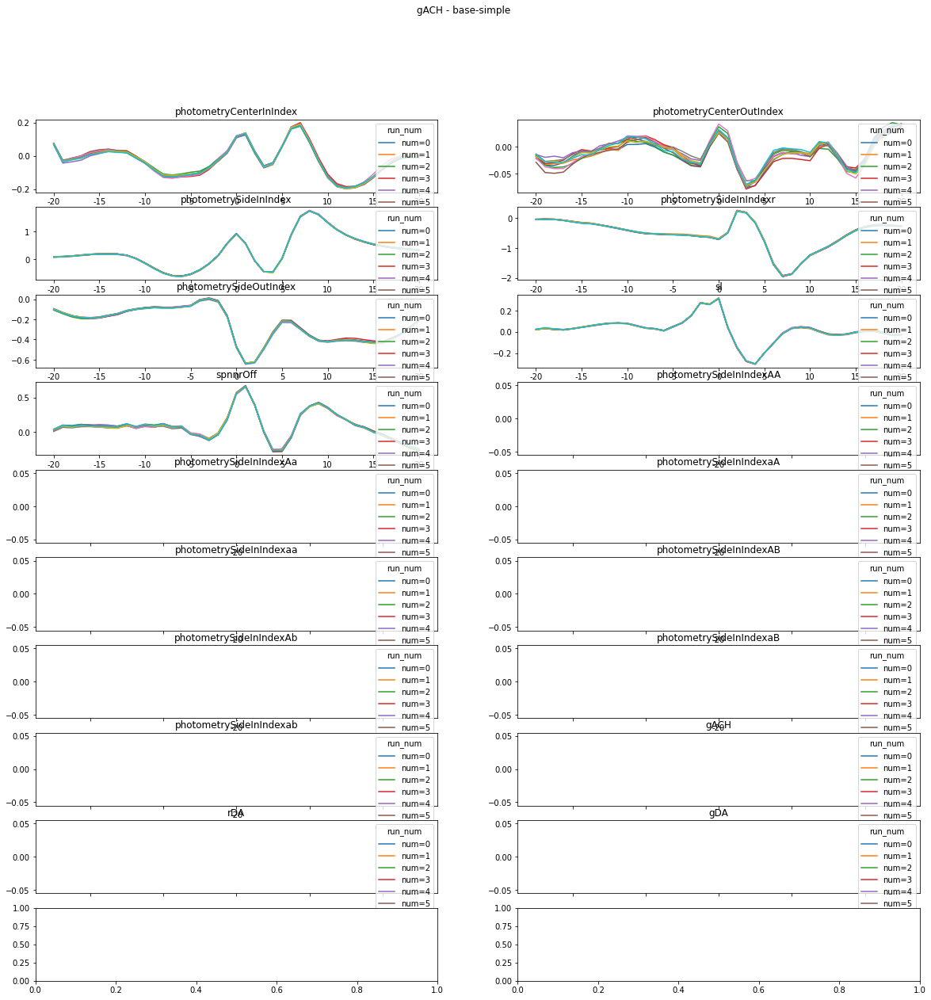

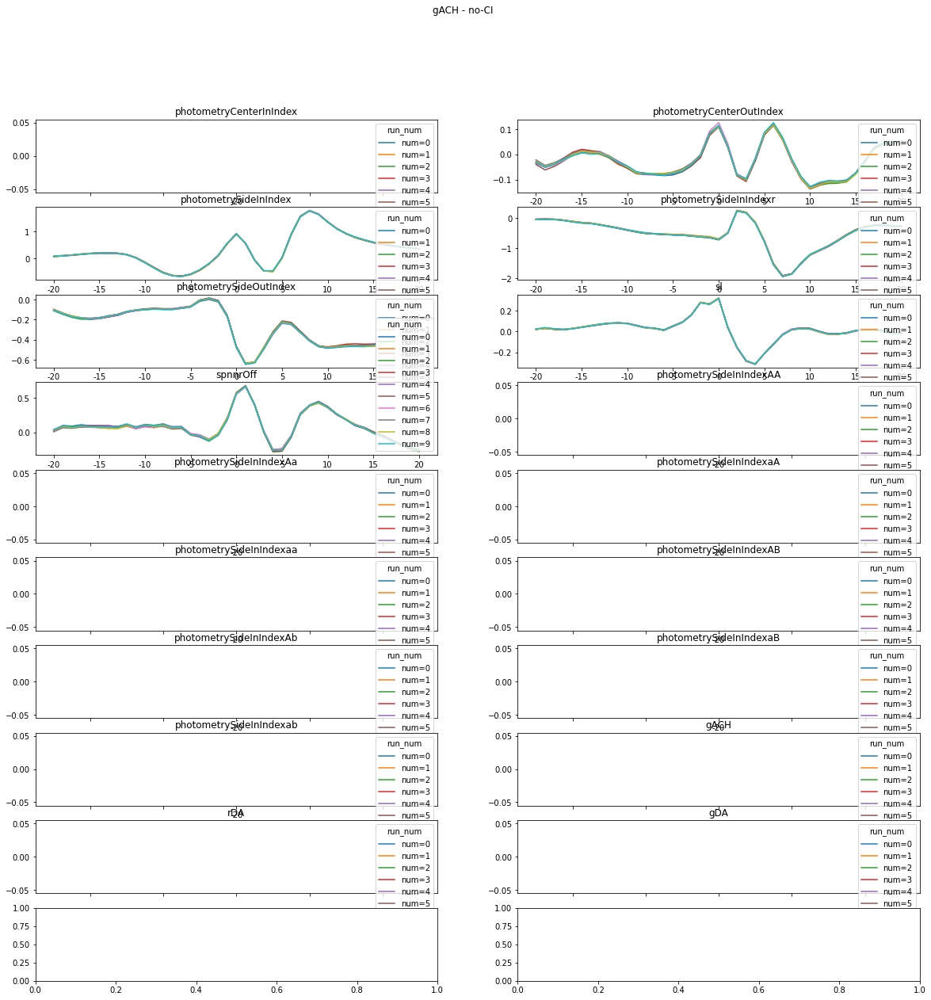

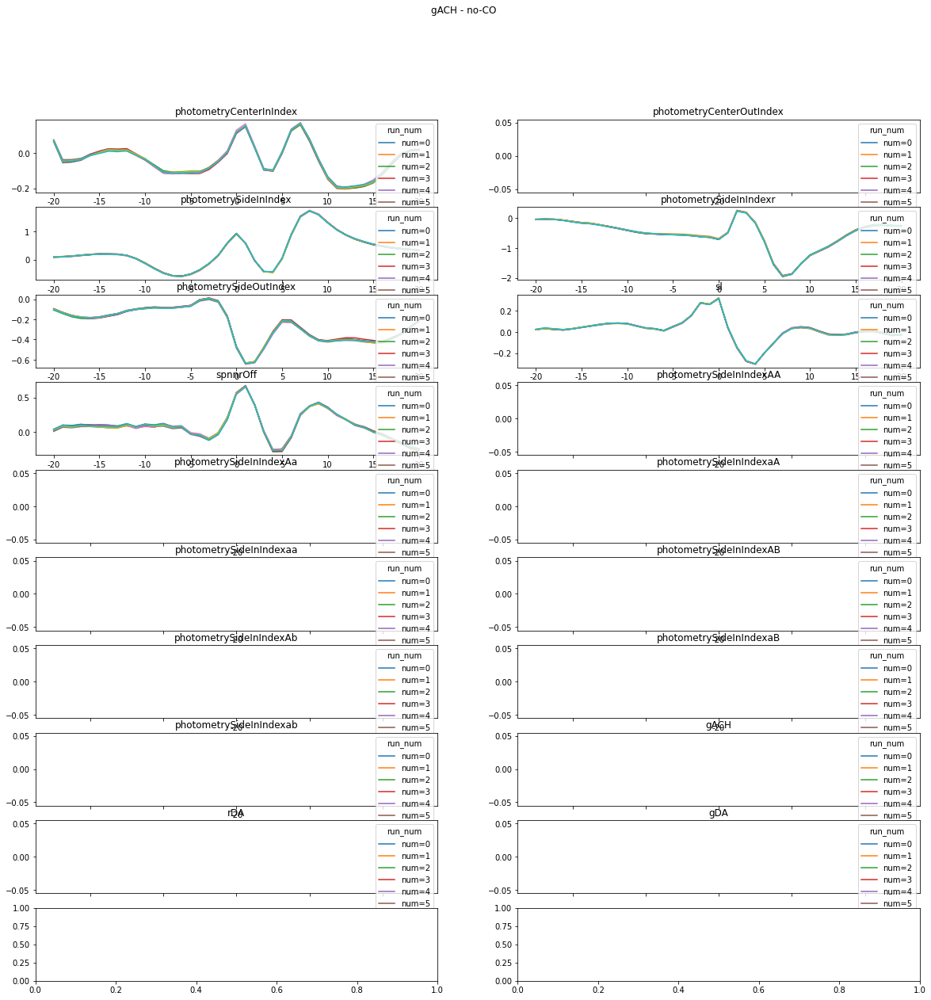

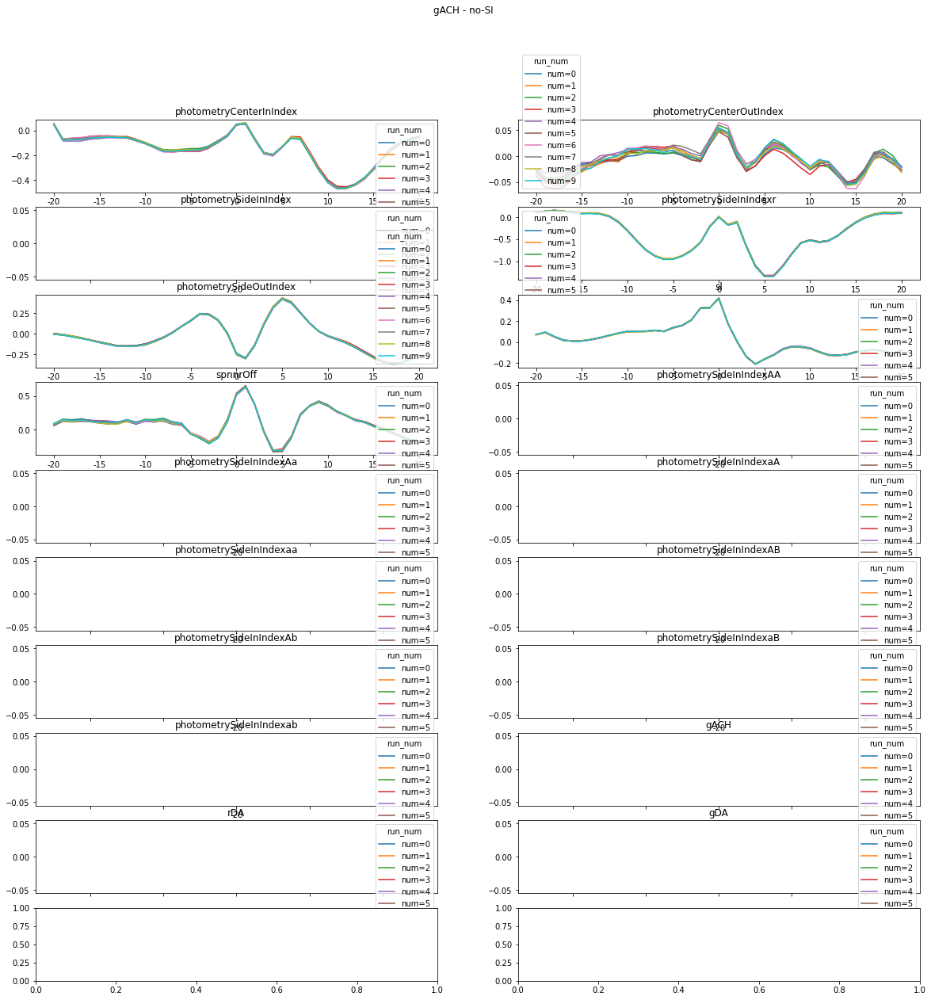

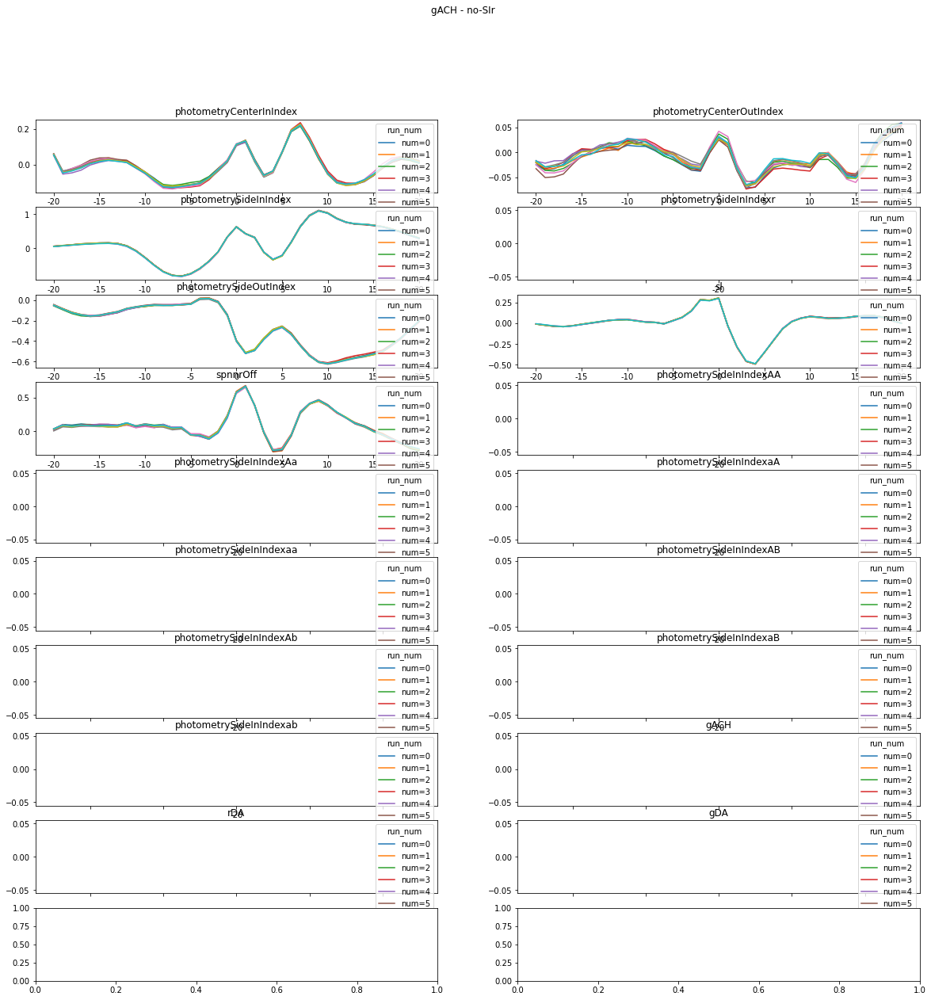

...

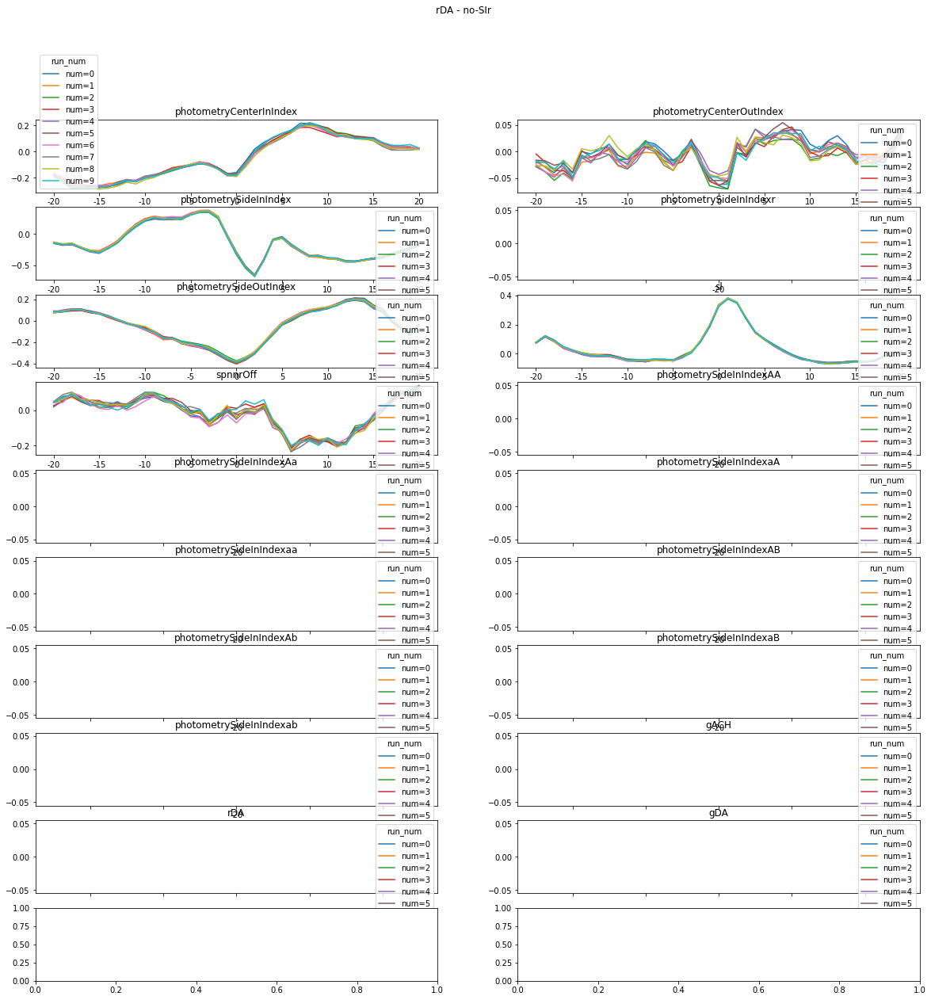

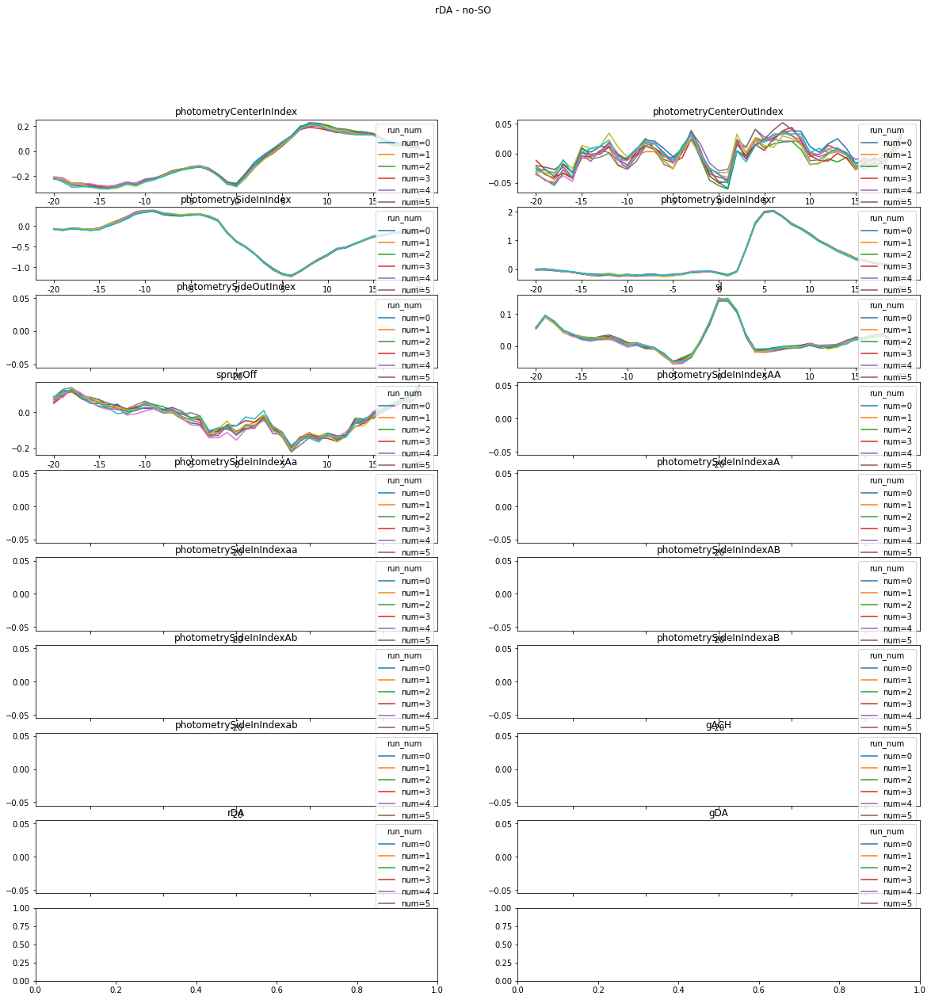

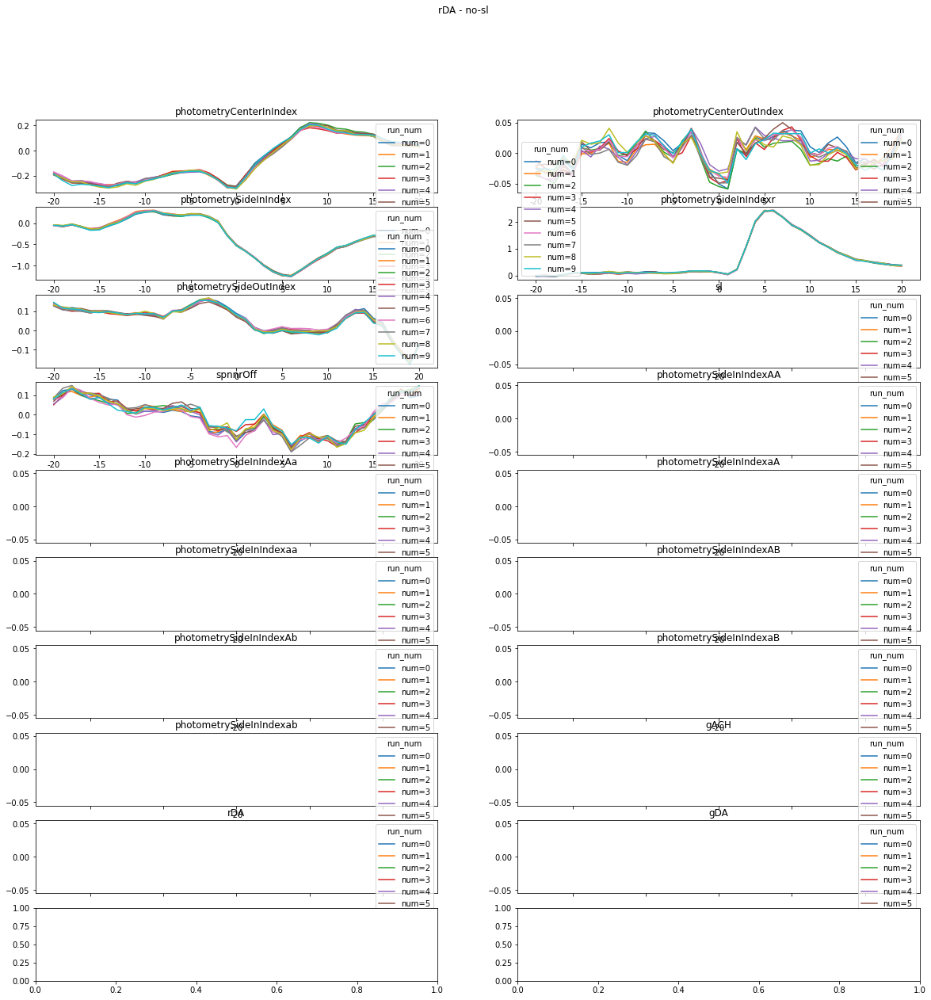

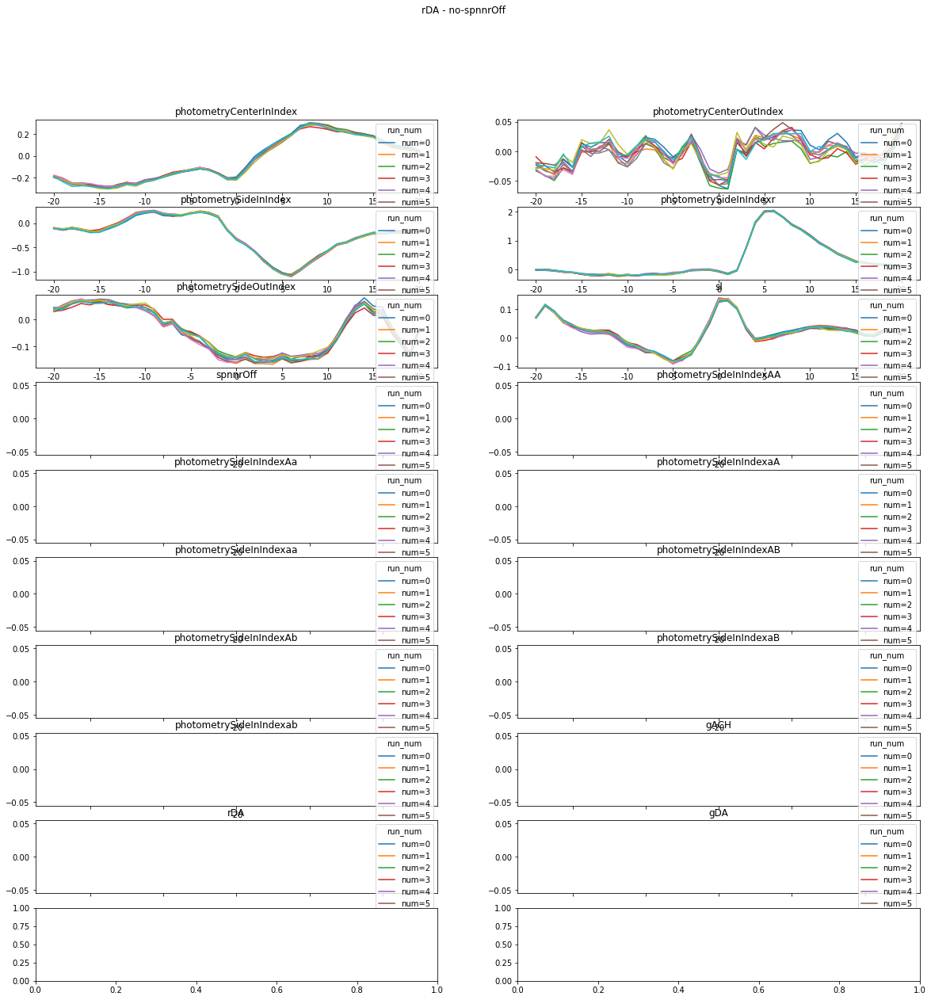

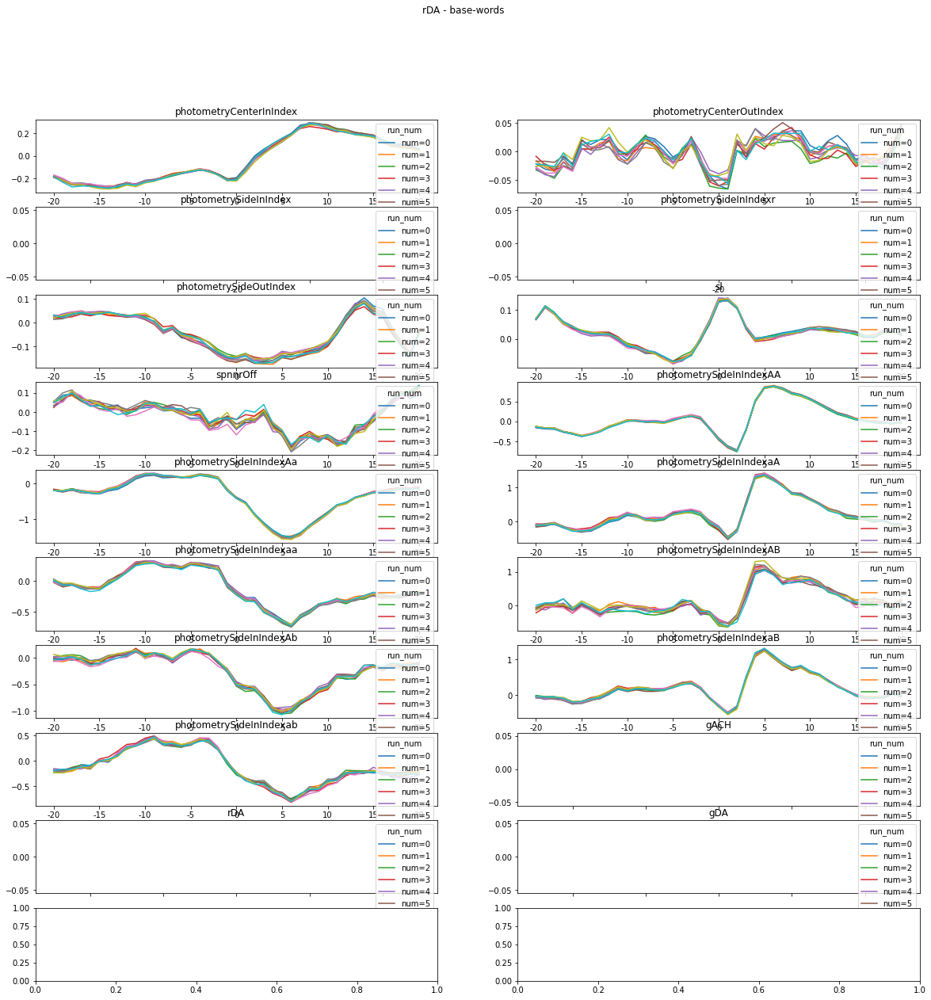

In [3]:
import glob
import pandas as pd
import matplotlib.pyplot as plt

coef_dfs = []
for run_file in glob.glob('/Users/josh/Documents/Harvard/GLM/sabatinilab-glm/sglm/outputs/fig1/all/only-all-10x-h_*/reports/coeffs/best_coeffs/*'):
    coef_dfs.append(pd.read_csv(run_file))

concat = pd.concat(coef_dfs)
concat = concat.sort_values('channel_name')
concat['channel'] = concat['channel_name'].str.split('_').apply(lambda x: x[0])
concat['run_num'] = concat['channel_name'].str.split('_').apply(lambda x: x[-1])
# concat = concat.sort_values([['channel', 'name', 'run_num']])

base_keys = list({
                'photometryCenterInIndex':(0,0),
                'photometryCenterOutIndex':(0,0),
                'photometrySideInIndex':(0,0),
                'photometrySideInIndexr':(0,0),
                'photometrySideOutIndex':(0,0),
                'sl': (0,0),
                'spnnrOff': (0,0),
                'photometryCenterInIndex':(0,0),
                'photometryCenterOutIndex':(0,0),
                'photometrySideInIndexAA':(0,0),
                'photometrySideInIndexAa':(0,0),
                'photometrySideInIndexaA':(0,0),
                'photometrySideInIndexaa':(0,0),
                'photometrySideInIndexAB':(0,0),
                'photometrySideInIndexAb':(0,0),
                'photometrySideInIndexaB':(0,0),
                'photometrySideInIndexab':(0,0),
                'photometrySideOutIndex':(0,0),
                'sl': (0,0),
                'spnnrOff': (0,0),
                'gACH':(0,0),
                'rDA':(0,0),
                'gDA':(0,0),
                }.keys())
base_keys

for channel in concat['channel'].unique():
    for name in concat['name'].unique():
        fig,ax_all = plt.subplots(len(base_keys)//2+1,2,figsize=(20,20))
        fig.set_facecolor('white')
        fig.suptitle(f'{channel} - {name}')
        for icol, col in enumerate(base_keys):
            ax = ax_all[icol//2, icol%2]
            col_filt = col + '_'
            tmp_df = concat
            tmp_df = tmp_df[(tmp_df['name'] == name)&(tmp_df['channel'] == channel)]
            tmp_df = tmp_df.set_index('run_num')
            tmp_df = tmp_df[[_ for _ in tmp_df.columns if col_filt in _]].rename({_:_.replace(col_filt, '') for _ in tmp_df.columns}, axis=1).copy()
            tmp_df.T.plot(ax=ax)
            ax.set_title(f'{col}')
    # break

In [4]:
concat

,Unnamed: 0,mouse_id,channel_name,name,mse_tr,mse_cv,mse_te,r2_tr,r2_cv,r2_te,...,photometrySideInIndexr_13,photometrySideInIndexr_14,photometrySideInIndexr_15,photometrySideInIndexr_16,photometrySideInIndexr_17,photometrySideInIndexr_18,photometrySideInIndexr_19,photometrySideInIndexr_20,channel,run_num
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_g...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,gACH_0_run_num=0,base-simple,0.774925,0.772179,0.767450,0.207787,0.206845,0.208341,...,-0.765945,-0.571120,-0.414079,-0.311740,-0.255167,-0.237273,-0.262378,-0.263596,gACH,num=0
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_g...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,gACH_0_run_num=1,base-simple,0.771397,0.770575,0.782902,0.208869,0.209659,0.203842,...,-0.750963,-0.552677,-0.389735,-0.288644,-0.231221,-0.224125,-0.258849,-0.265277,gACH,num=1
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_g...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,gACH_0_run_num=2,base-simple,0.773037,0.775784,0.776367,0.208642,0.207963,0.204677,...,-0.756353,-0.558254,-0.386058,-0.277512,-0.217917,-0.207884,-0.236714,-0.242641,gACH,num=2
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_g...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,gACH_0_run_num=3,base-simple,0.775980,0.777637,0.764039,0.207014,0.207204,0.211477,...,-0.784400,-0.586230,-0.414272,-0.296443,-0.233415,-0.221228,-0.259595,-0.270947,gACH,num=3
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_g...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,gACH_0_run_num=4,base-simple,0.772536,0.774039,0.778617,0.208028,0.207770,0.207219,...,-0.773549,-0.567073,-0.407294,-0.297535,-0.247615,-0.232448,-0.252287,-0.252420,gACH,num=4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_r...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,rDA_8_run_num=5,base-words,0.794308,0.794087,0.788723,0.186127,0.181523,0.189112,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rDA,num=5
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_r...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,rDA_8_run_num=6,base-words,0.792756,0.793940,0.795603,0.185626,0.182411,0.191802,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rDA,num=6
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_r...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,rDA_8_run_num=7,base-words,0.790357,0.795595,0.805582,0.190066,0.186180,0.171904,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rDA,num=7
0,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56_r...,63_64_65_66_67_68_69_57_58_59_60_61_53_55_56,rDA_8_run_num=8,base-words,0.792869,0.797811,0.794675,0.188123,0.183842,0.180490,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rDA,num=8


<ipython-input-7-1256782c4a6c>:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax_all = plt.subplots(len(base_keys)//2+1,2,figsize=(20,20))


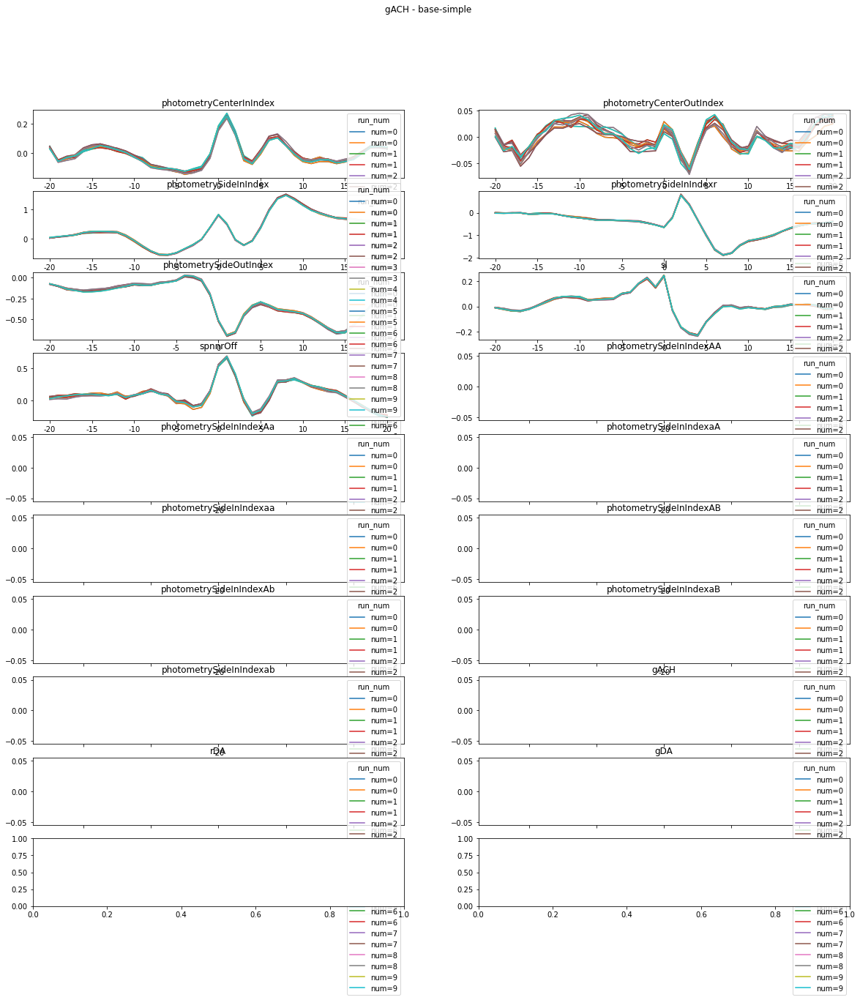

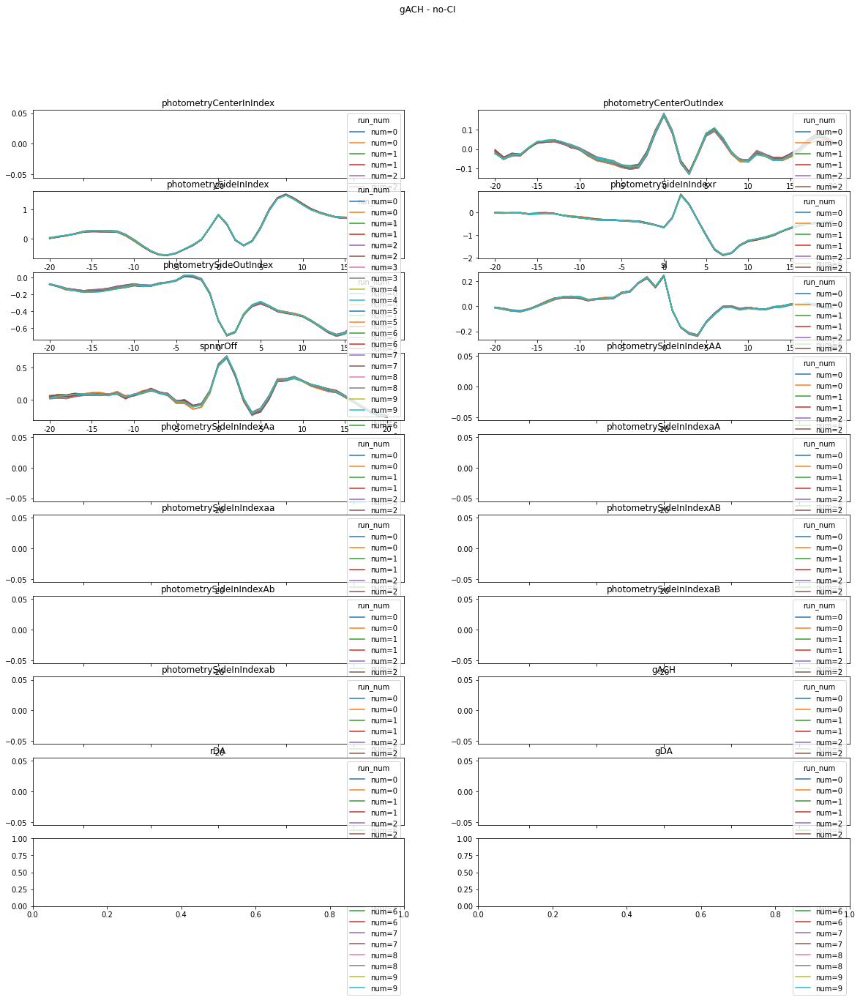

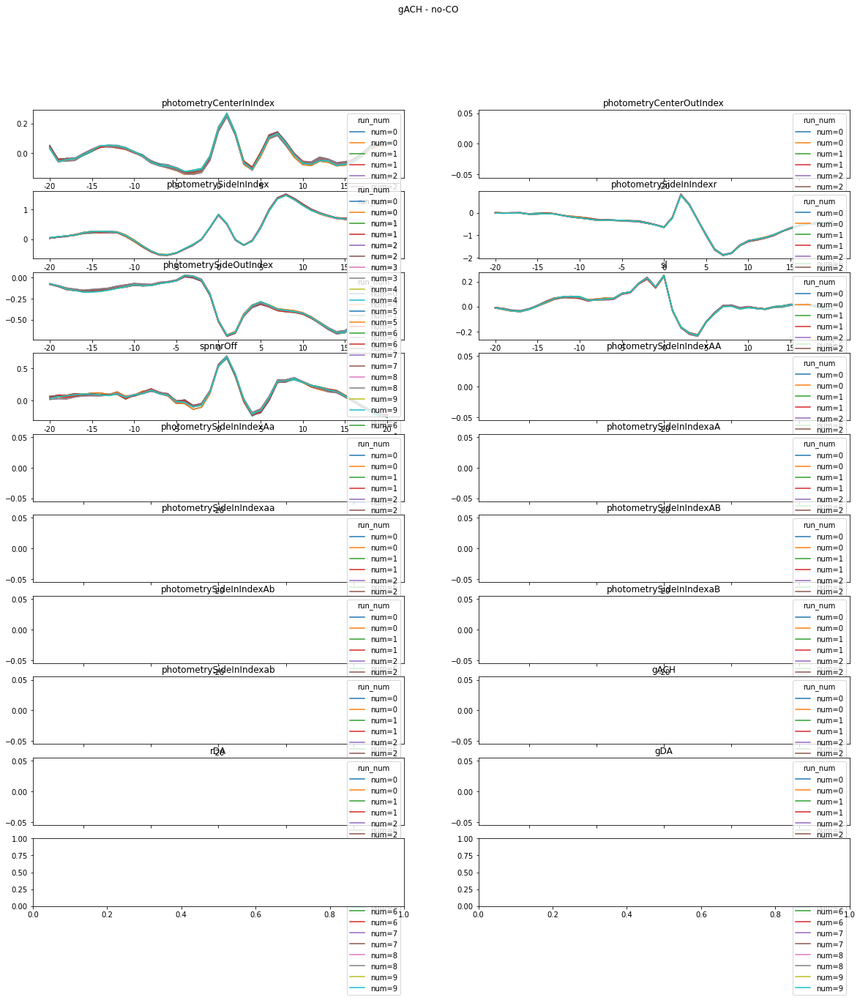

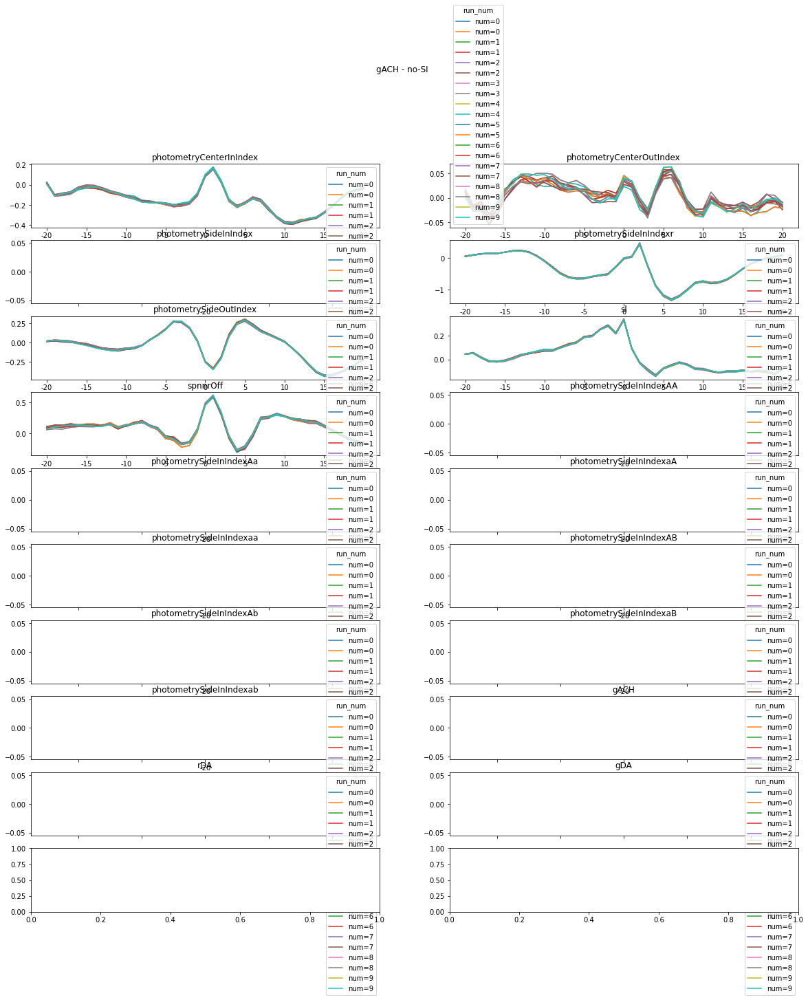

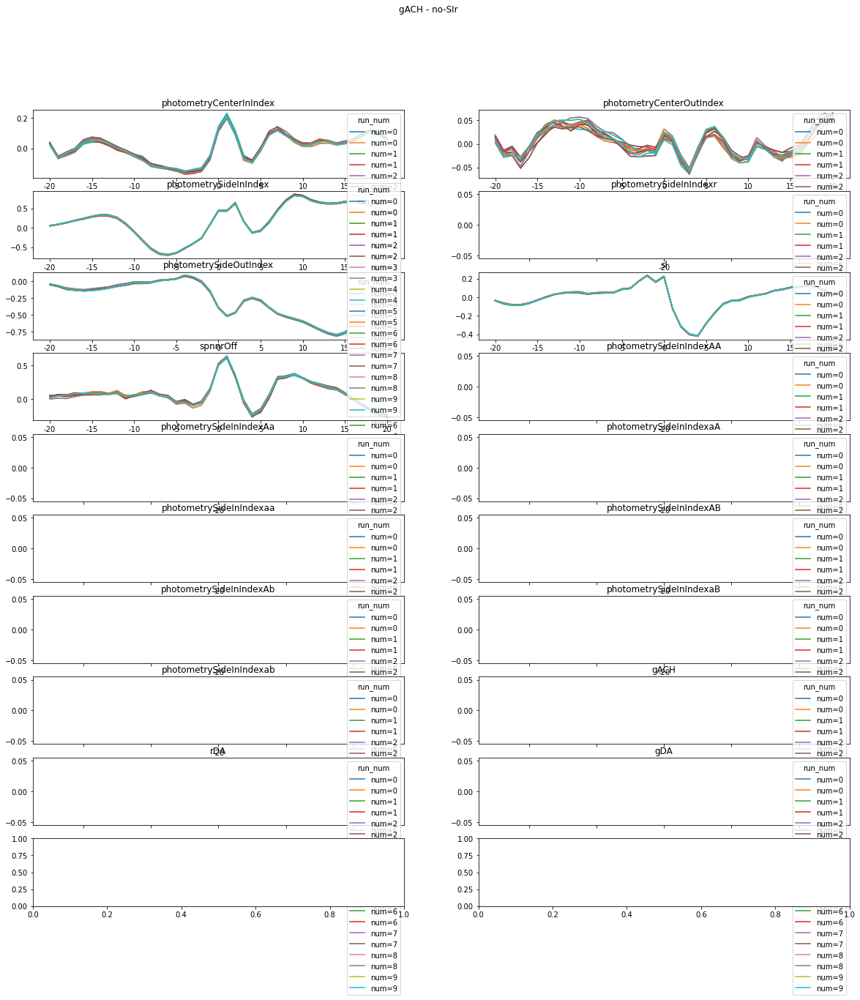

...

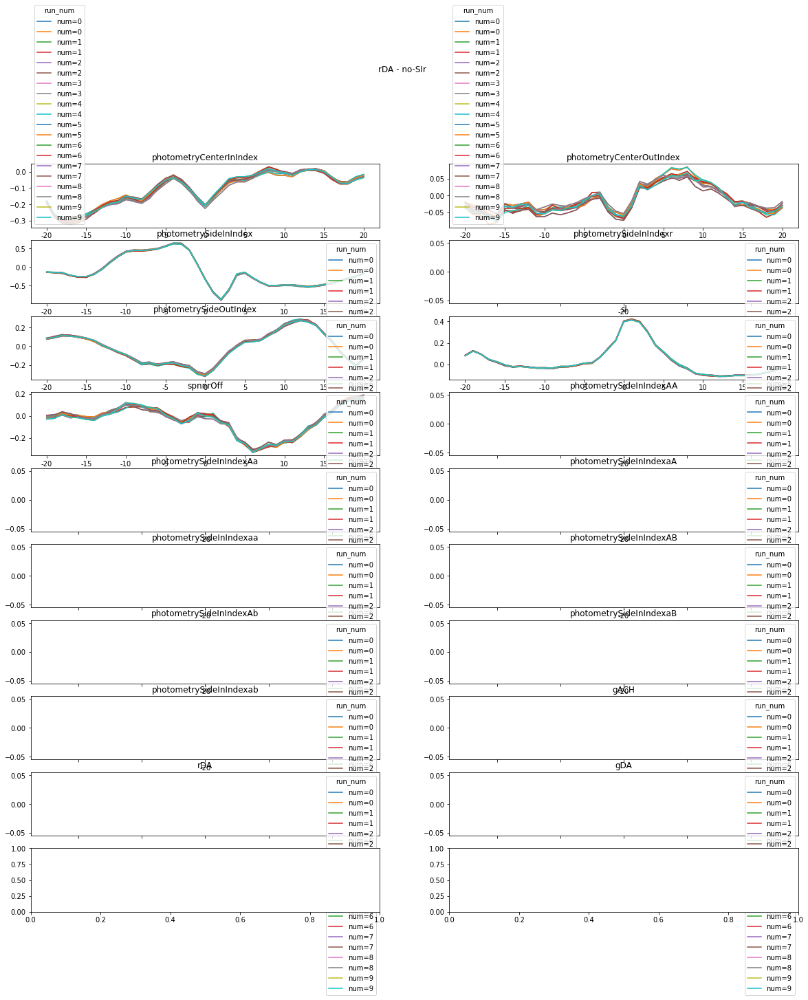

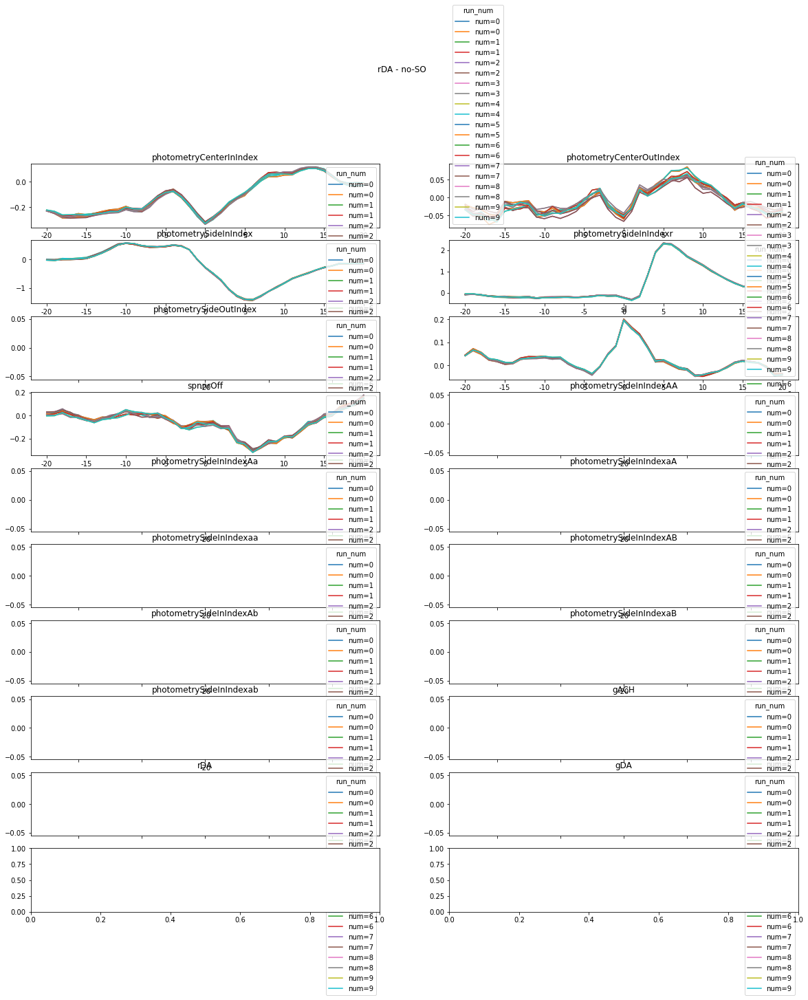

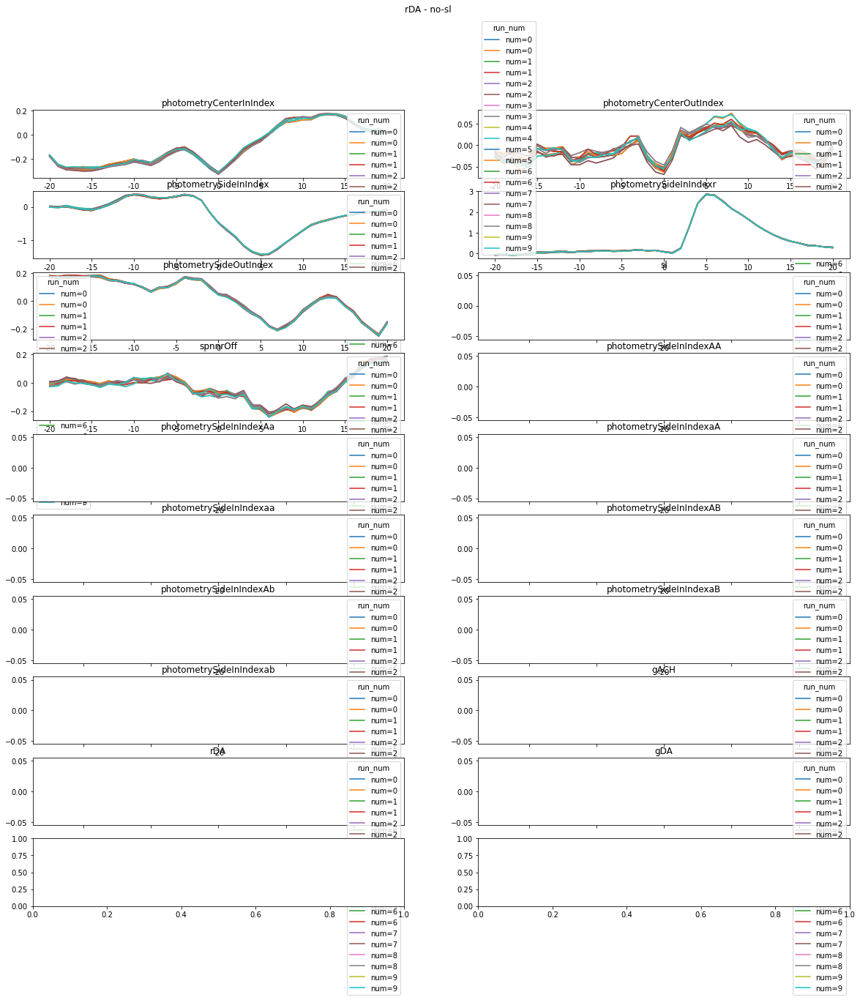

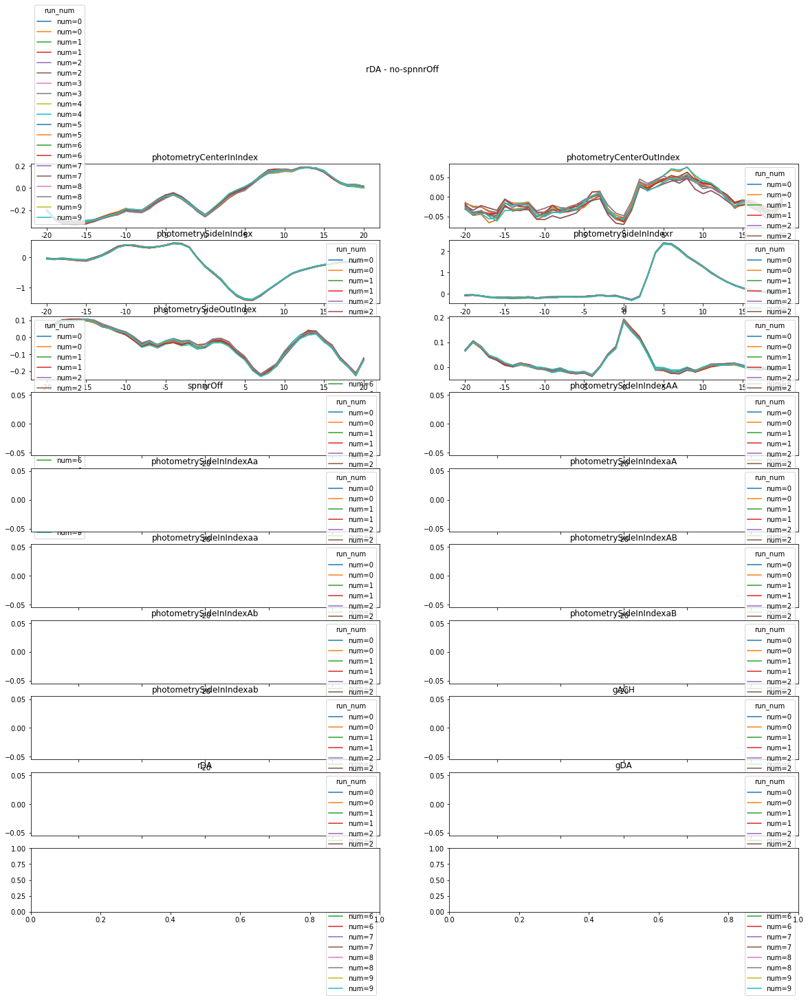

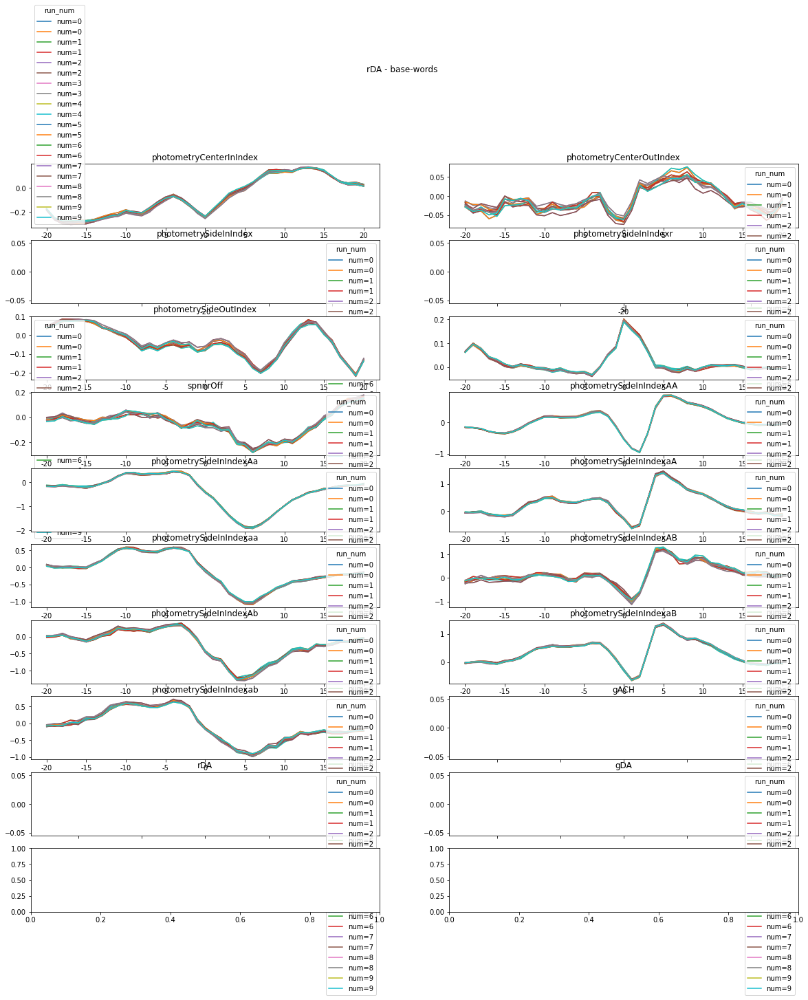

In [7]:
import glob
import pandas as pd
import matplotlib.pyplot as plt

coef_dfs = []
# for run_file in glob.glob('/Users/josh/Documents/Harvard/GLM/sabatinilab-glm/sglm/outputs/fig1/all/only-all-10x-h_*/reports/coeffs/best_coeffs/*'):
for run_file in glob.glob('/Users/josh/Documents/Harvard/GLM/sabatinilab-glm/sglm/outputs/f3/oa-i*/best_combined_coeffs/*'):
    coef_dfs.append(pd.read_csv(run_file))

concat = pd.concat(coef_dfs)
concat = concat.sort_values('channel_name')
concat['channel'] = concat['channel_name'].str.split('_').apply(lambda x: x[0])
concat['run_num'] = concat['channel_name'].str.split('_').apply(lambda x: x[-1])
# concat = concat.sort_values([['channel', 'name', 'run_num']])

# base_keys = list({
#                 'photometryCenterInIndex':(0,0),
#                 'photometryCenterOutIndex':(0,0),
#                 'photometrySideInIndex':(0,0),
#                 'photometrySideInIndexr':(0,0),
#                 'photometrySideOutIndex':(0,0),
#                 'sl': (0,0),
#                 'spnnrOff': (0,0),
#                 'photometryCenterInIndex':(0,0),
#                 'photometryCenterOutIndex':(0,0),
#                 'photometrySideInIndexAA':(0,0),
#                 'photometrySideInIndexAa':(0,0),
#                 'photometrySideInIndexaA':(0,0),
#                 'photometrySideInIndexaa':(0,0),
#                 'photometrySideInIndexAB':(0,0),
#                 'photometrySideInIndexAb':(0,0),
#                 'photometrySideInIndexaB':(0,0),
#                 'photometrySideInIndexab':(0,0),
#                 'photometrySideOutIndex':(0,0),
#                 'sl': (0,0),
#                 'spnnrOff': (0,0),
#                 'gACH':(0,0),
#                 'rDA':(0,0),
#                 'gDA':(0,0),
#                 }.keys())
# base_keys

for channel in concat['channel'].unique():
    for name in concat['name'].unique():
        fig,ax_all = plt.subplots(len(base_keys)//2+1,2,figsize=(20,20))
        fig.set_facecolor('white')
        fig.suptitle(f'{channel} - {name}')
        for icol, col in enumerate(base_keys):
            ax = ax_all[icol//2, icol%2]
            col_filt = col + '_'
            tmp_df = concat
            tmp_df = tmp_df[(tmp_df['name'] == name)&(tmp_df['channel'] == channel)]
            tmp_df = tmp_df.set_index('run_num')
            tmp_df = tmp_df[[_ for _ in tmp_df.columns if col_filt in _]].rename({_:_.replace(col_filt, '') for _ in tmp_df.columns}, axis=1).copy()
            tmp_df.T.plot(ax=ax)
            ax.set_title(f'{col}')
    # break



No Data: gACH gACH-to-gDA photometryCenterInIndex
No Data: gACH gACH-to-gDA photometryCenterOutIndex
No Data: gACH gACH-to-gDA photometrySideInIndex
No Data: gACH gACH-to-gDA photometrySideInIndexr
No Data: gACH gACH-to-gDA photometrySideOutIndex
No Data: gACH gACH-to-gDA sl
No Data: gACH gACH-to-gDA spnnrOff
No Data: gACH gACH-to-gDA photometrySideInIndexAA
No Data: gACH gACH-to-gDA photometrySideInIndexAa
No Data: gACH gACH-to-gDA photometrySideInIndexaA
No Data: gACH gACH-to-gDA photometrySideInIndexaa
No Data: gACH gACH-to-gDA photometrySideInIndexAB
No Data: gACH gACH-to-gDA photometrySideInIndexAb
No Data: gACH gACH-to-gDA photometrySideInIndexaB
No Data: gACH gACH-to-gDA photometrySideInIndexab
No Data: gACH gACH-to-gDA gACH
No Data: gACH gACH-to-gDA rDA
No Data: gACH gACH-to-gDA gDA
No Data: gACH simple+gACH-to-gDA photometryCenterInIndex
No Data: gACH simple+gACH-to-gDA photometryCenterOutIndex
No Data: gACH simple+gACH-to-gDA photometrySideInIndex
No Data: gACH simple+gACH-to

<ipython-input-12-f7dcc84e9857>:45: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax_all = plt.subplots(len(base_keys)//2+1,2,figsize=(20,20))


No Data: gDA gACH-to-rDA photometryCenterInIndex
No Data: gDA gACH-to-rDA photometryCenterOutIndex
No Data: gDA gACH-to-rDA photometrySideInIndex
No Data: gDA gACH-to-rDA photometrySideInIndexr
No Data: gDA gACH-to-rDA photometrySideOutIndex
No Data: gDA gACH-to-rDA sl
No Data: gDA gACH-to-rDA spnnrOff
No Data: gDA gACH-to-rDA photometrySideInIndexAA
No Data: gDA gACH-to-rDA photometrySideInIndexAa
No Data: gDA gACH-to-rDA photometrySideInIndexaA
No Data: gDA gACH-to-rDA photometrySideInIndexaa
No Data: gDA gACH-to-rDA photometrySideInIndexAB
No Data: gDA gACH-to-rDA photometrySideInIndexAb
No Data: gDA gACH-to-rDA photometrySideInIndexaB
No Data: gDA gACH-to-rDA photometrySideInIndexab
No Data: gDA gACH-to-rDA gACH
No Data: gDA gACH-to-rDA rDA
No Data: gDA gACH-to-rDA gDA
No Data: gDA simple+gACH-to-rDA photometryCenterInIndex
No Data: gDA simple+gACH-to-rDA photometryCenterOutIndex
No Data: gDA simple+gACH-to-rDA photometrySideInIndex
No Data: gDA simple+gACH-to-rDA photometrySideInI

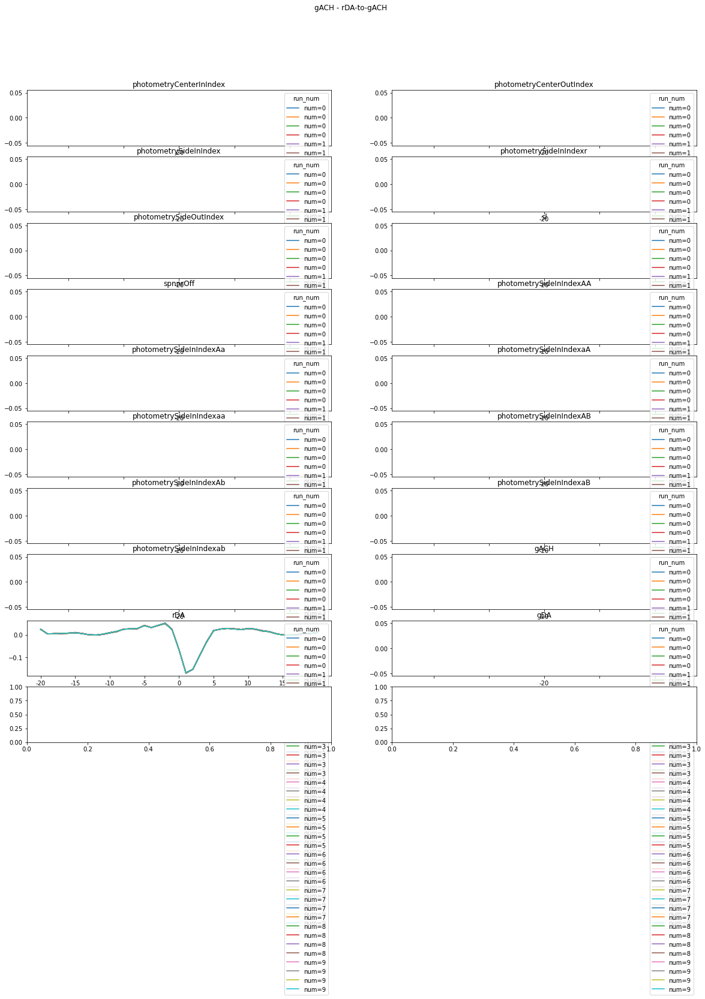

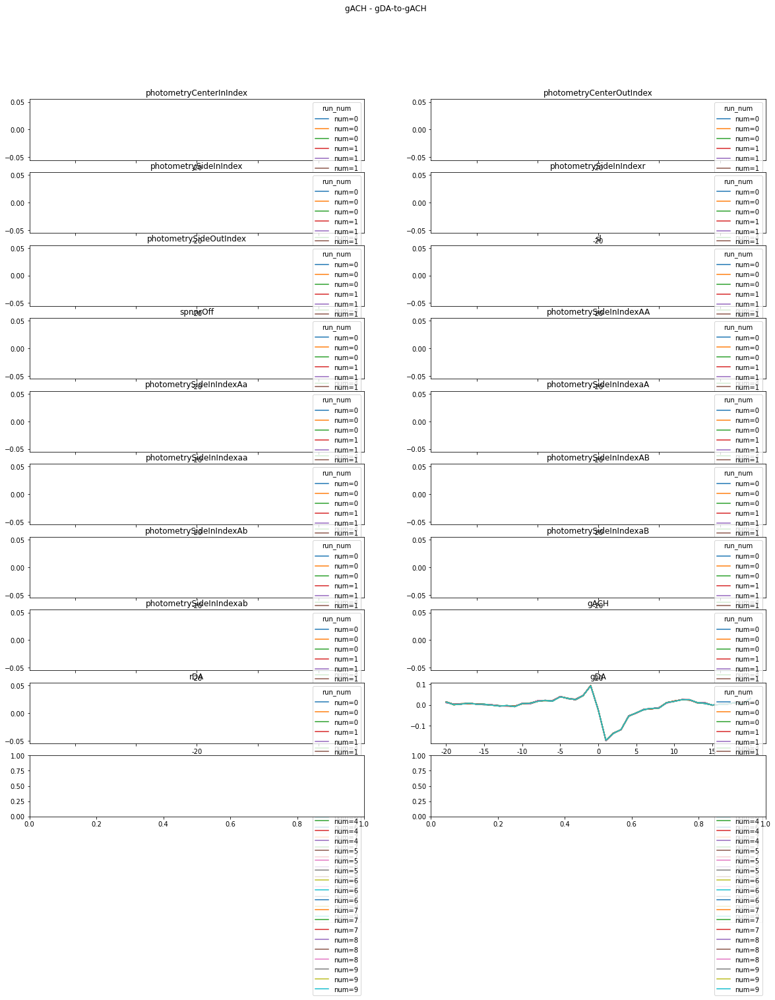

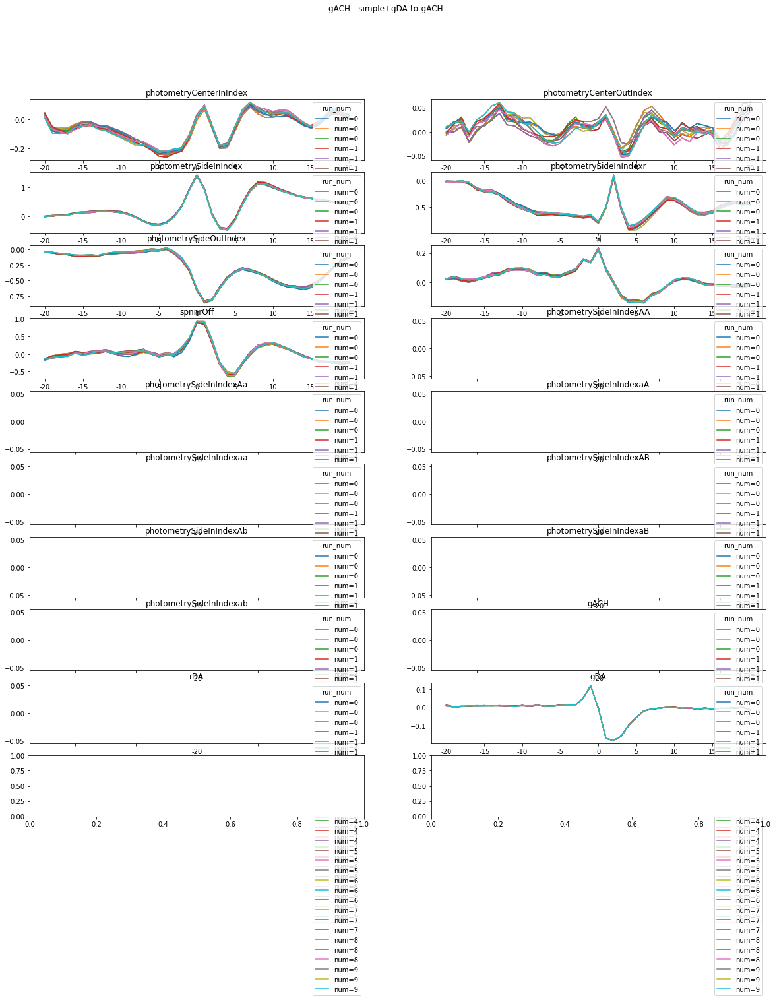

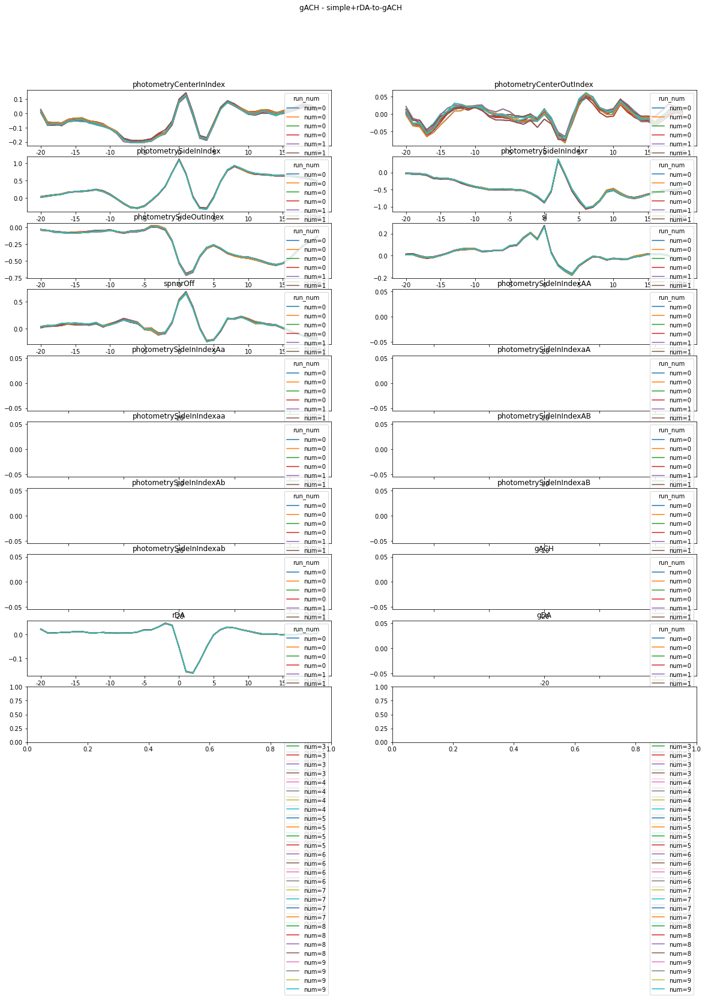

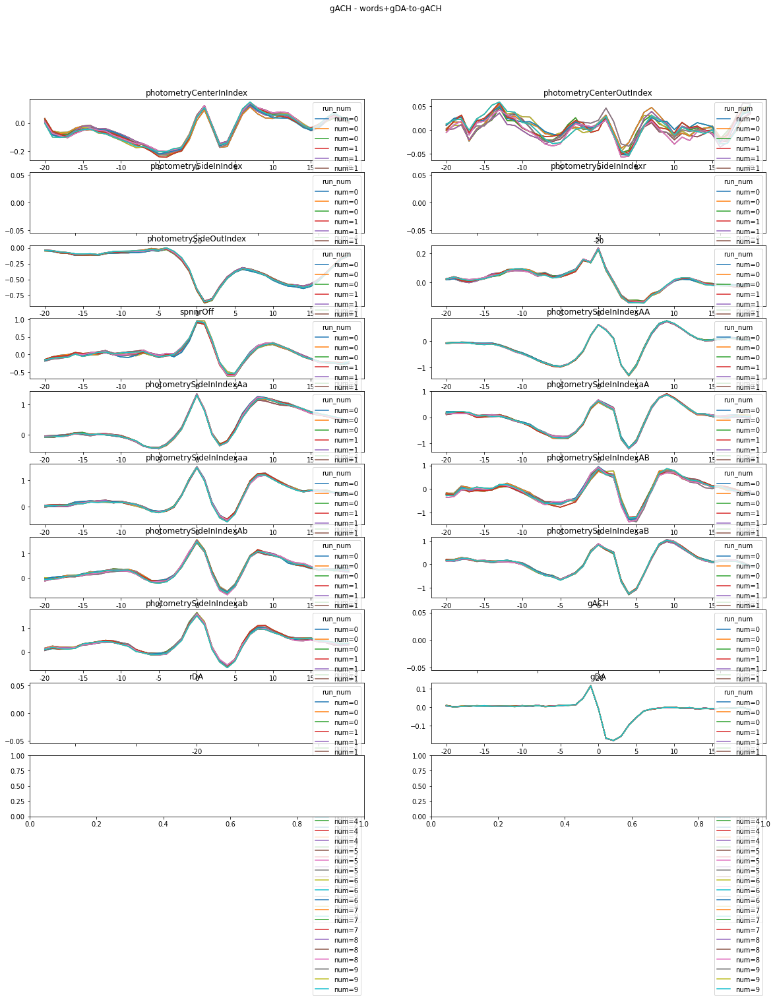

...

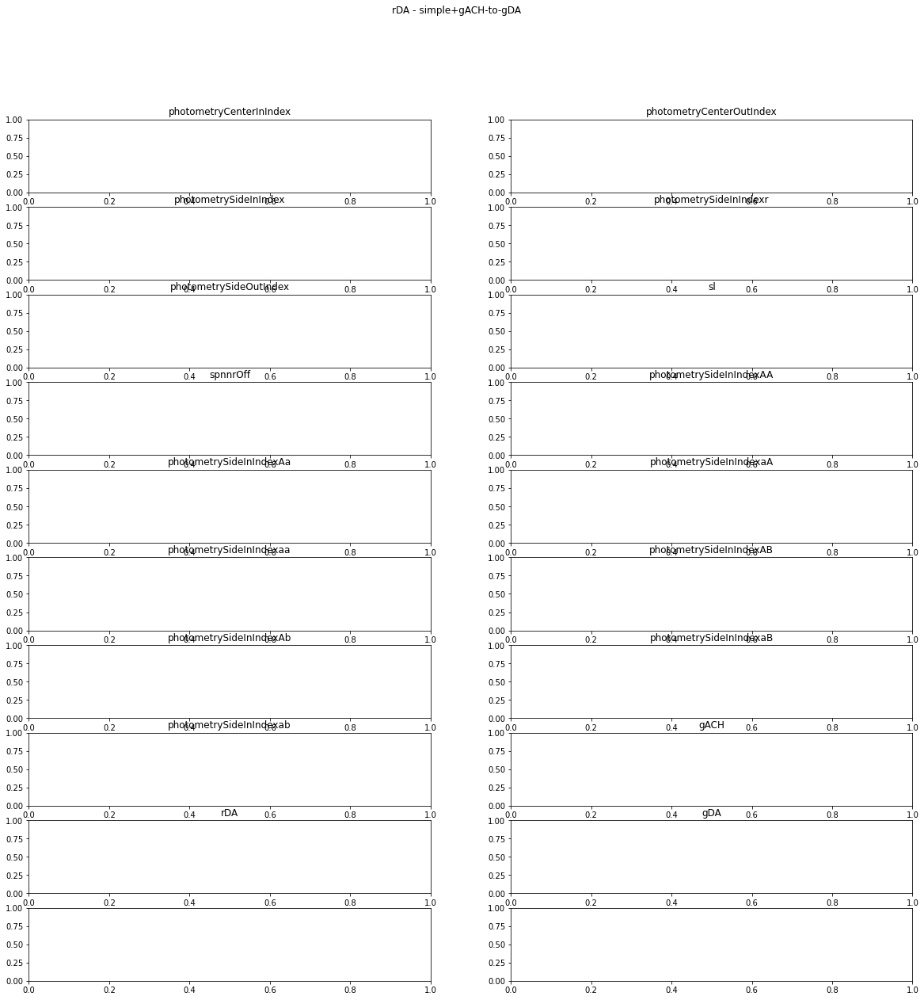

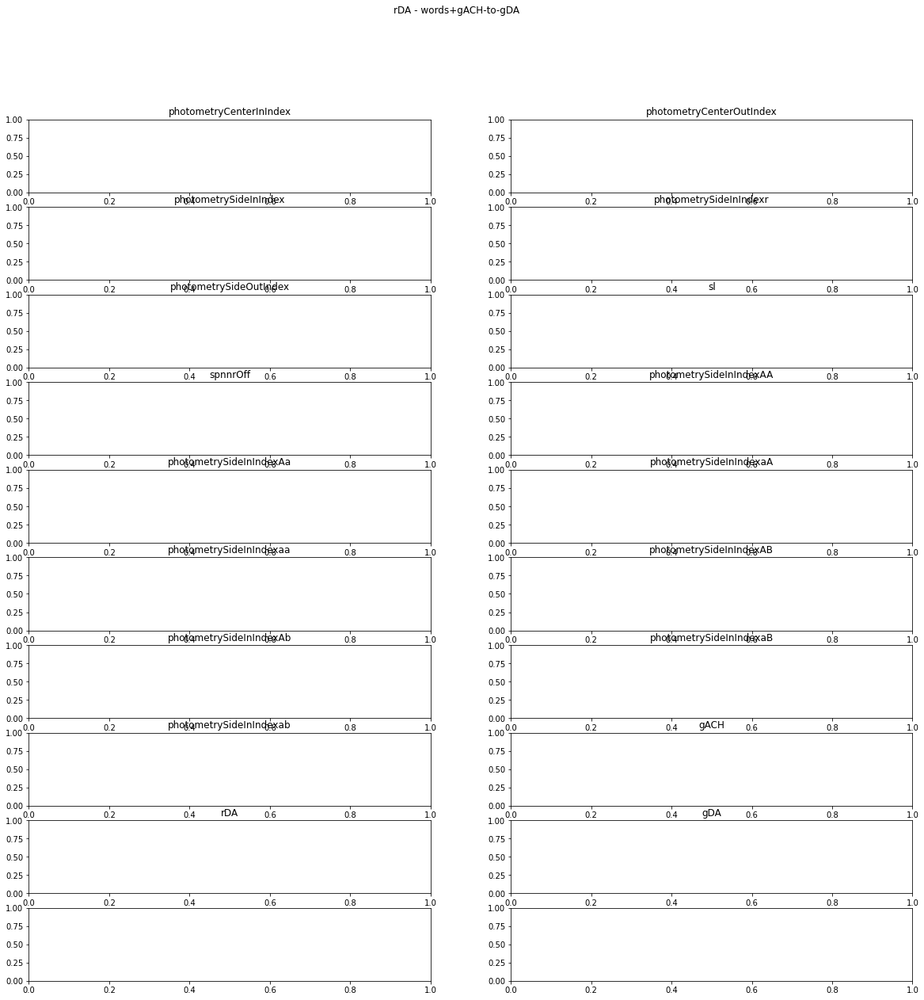

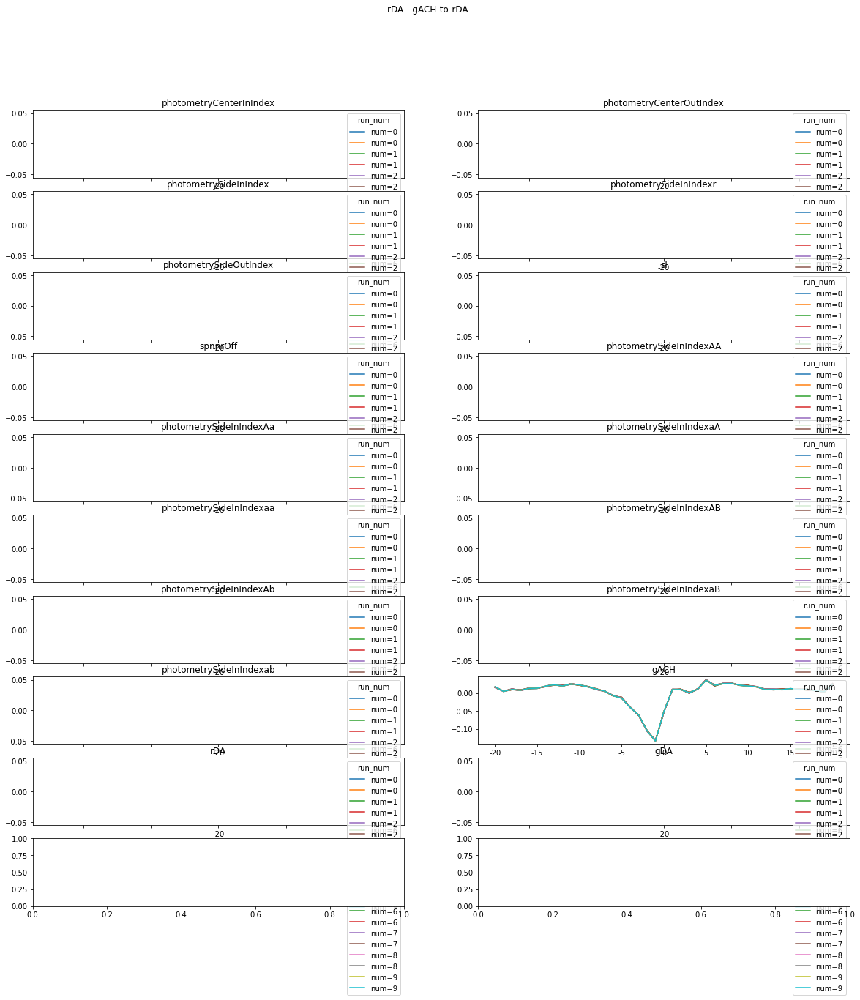

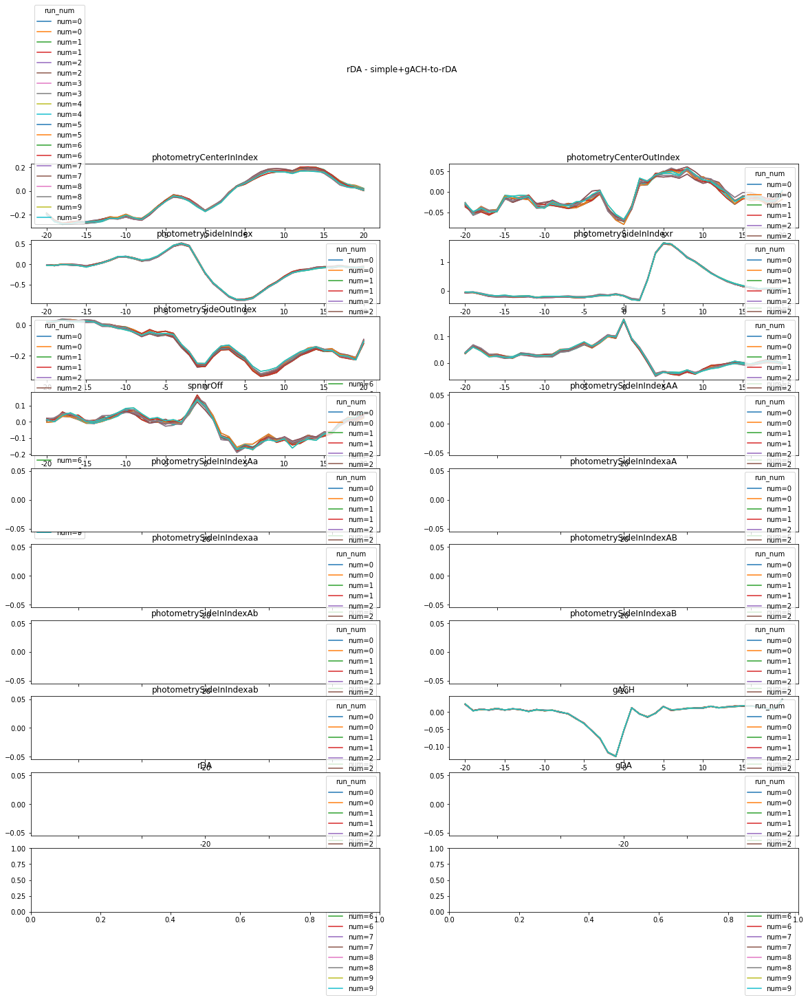

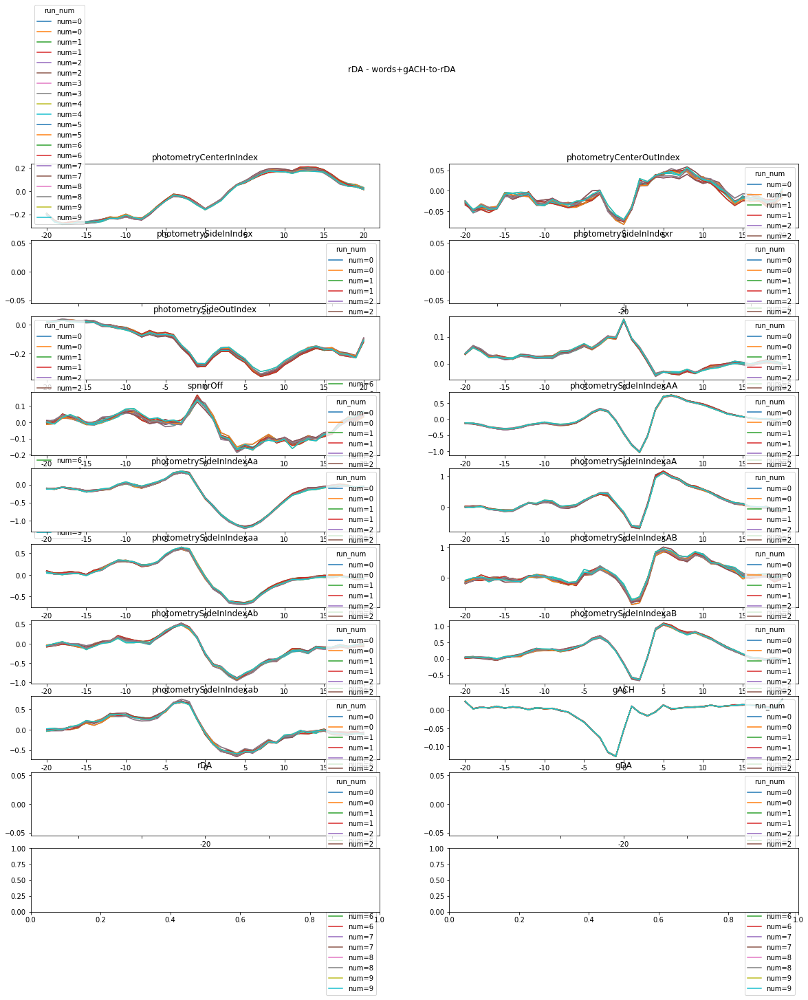

In [12]:
import glob
import pandas as pd
import matplotlib.pyplot as plt

coef_dfs = []
# for run_file in glob.glob('/Users/josh/Documents/Harvard/GLM/sabatinilab-glm/sglm/outputs/fig1/all/only-all-10x-h_*/reports/coeffs/best_coeffs/*'):
for run_file in glob.glob('/Users/josh/Documents/Harvard/GLM/sabatinilab-glm/sglm/outputs/f3/oa-sr-*/best_combined_coeffs/*'):
    coef_dfs.append(pd.read_csv(run_file))

concat = pd.concat(coef_dfs)
concat = concat.sort_values('channel_name')
concat['channel'] = concat['channel_name'].str.split('_').apply(lambda x: x[0])
concat['run_num'] = concat['channel_name'].str.split('_').apply(lambda x: x[-1])
# concat = concat.sort_values([['channel', 'name', 'run_num']])

base_keys = list({
                'photometryCenterInIndex':(0,0),
                'photometryCenterOutIndex':(0,0),
                'photometrySideInIndex':(0,0),
                'photometrySideInIndexr':(0,0),
                'photometrySideOutIndex':(0,0),
                'sl': (0,0),
                'spnnrOff': (0,0),
                'photometryCenterInIndex':(0,0),
                'photometryCenterOutIndex':(0,0),
                'photometrySideInIndexAA':(0,0),
                'photometrySideInIndexAa':(0,0),
                'photometrySideInIndexaA':(0,0),
                'photometrySideInIndexaa':(0,0),
                'photometrySideInIndexAB':(0,0),
                'photometrySideInIndexAb':(0,0),
                'photometrySideInIndexaB':(0,0),
                'photometrySideInIndexab':(0,0),
                'photometrySideOutIndex':(0,0),
                'sl': (0,0),
                'spnnrOff': (0,0),
                'gACH':(0,0),
                'rDA':(0,0),
                'gDA':(0,0),
                }.keys())
base_keys

for channel in concat['channel'].unique():
    for name in concat['name'].unique():
        fig,ax_all = plt.subplots(len(base_keys)//2+1,2,figsize=(20,20))
        fig.set_facecolor('white')
        fig.suptitle(f'{channel} - {name}')
        for icol, col in enumerate(base_keys):
            ax = ax_all[icol//2, icol%2]
            col_filt = col + '_'
            tmp_df = concat
            tmp_df = tmp_df[(tmp_df['name'] == name)&(tmp_df['channel'] == channel)]
            tmp_df = tmp_df.set_index('run_num')
            tmp_df = tmp_df[[_ for _ in tmp_df.columns if col_filt in _]].rename({_:_.replace(col_filt, '') for _ in tmp_df.columns}, axis=1).copy()
            try:
                tmp_df.T.plot(ax=ax)
            except:
                print('No Data:', channel, name, col)
            ax.set_title(f'{col}')
    # break



In [ ]:
# coef_ci = concat.sort_values('channel_name').groupby('name')[
#     ['mse_tr', 'mse_cv', 'mse_te', 
#     #'r2_tr', 'r2_cv', 'r2_te'
#     ]
# ].agg([np.min, np.max, np.mean, #np.std, np.size
#     ])
# coef_ci.columns = ['_'.join(_) for _ in coef_ci.columns]
for group, group_df in concat.groupby(['channel']):
    fig, ax = plt.subplots(1,1,figsize=(10, 10))
    # display(group_df)
    if type(group) == list:
        title = '_'.join(group)
    else:
        title = group
    group_df.set_index(['name'])[['mse_tr', 'mse_cv', 'mse_te']].plot(marker='.', linestyle='', alpha=0.5, title=title, ax=ax)
    ax.set_xticks([_ for _ in range(len(group_df)) if _%10 == 0])
    ax.set_xticklabels(group_df['name'].iloc[[_ for _ in range(len(group_df)) if _%10 == 0]])
    ax.grid(True)

In [ ]:
concat2 = concat.copy()
concat2['mse_dif'] = (concat2['mse_tr'] <= concat2['mse_te'])
concat2['mse_del'] = (concat2['mse_te'] - concat2['mse_tr'])
concat2['r2_dif'] = (concat2['r2_tr'] > concat2['r2_te'])
concat2['r2_del'] = (concat2['r2_tr'] - concat2['r2_te'])
concat2_out = np.round(concat2.groupby(['channel', 'name'])[['mse_dif', 'r2_dif']].agg([np.sum, np.size, np.mean]), 4)
display(concat2_out)
concat2_out = np.round(concat2.groupby(['channel', 'name'])[['mse_del', 'r2_del']].agg([np.mean, np.max, np.min]), 4)
display(concat2_out)

In [ ]:
# delta